# Imports and WandB-login

In [ ]:
import detectron2
from drone_detector.imports import *

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog, build_detection_test_loader, build_detection_train_loader, DatasetMapper

from detectron2.data import transforms as T
from detectron2.data import detection_utils as utils
import torch

In [ ]:
import json
outpath = Path('../data/hiidenportti/processed/')



In [ ]:
val_files = ['104_59_Hiidenportti_Chunk3_orto',
             '104_112_Hiidenportti_Chunk9_orto',
             '104_29_Hiidenportti_Chunk1_orto',
             '104_39_Hiidenportti_Chunk1_orto',
             '104_119_Hiidenportti_Chunk6_orto']

In [ ]:
import wandb

## Split full dataset to train and val files

In [ ]:
with open(outpath/'full_hiidenportti_coco.json') as f:
    full_coco = json.load(f)

In [ ]:
full_coco.keys()

dict_keys(['info', 'licenses', 'images', 'annotations', 'categories', 'segment_info'])

In [ ]:
files = [(i['file_name'], i['id']) for i in full_coco['images']]

In [ ]:
train_split = [f[1] for f in files if not any(v in f[0] for v in val_files)]
valid_split = [f[1] for f in files if any(v in f[0] for v in val_files)]

In [ ]:
from copy import deepcopy

In [ ]:
train_coco = deepcopy(full_coco)
train_coco['images'] = [i for i in train_coco['images'] if i['id'] in train_split]
train_coco['annotations'] = [a for a in train_coco['annotations'] if a['image_id'] in train_split]

In [ ]:
valid_coco = deepcopy(full_coco)
valid_coco['images'] = [i for i in valid_coco['images'] if i['id'] in valid_split]
valid_coco['annotations'] = [a for a in valid_coco['annotations'] if a['image_id'] in valid_split]

In [ ]:
with open(outpath/'hiidenportti_train.json', 'w') as outf: json.dump(train_coco, outf)
with open(outpath/'hiidenportti_val.json', 'w') as outf: json.dump(valid_coco, outf)

# Register dataset

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances('hiidenportti_train', {}, outpath/'hiidenportti_train.json', outpath)
register_coco_instances('hiidenportti_val', {}, outpath/'hiidenportti_val.json', outpath)

In [ ]:
from detectron2.engine import DefaultTrainer

from detectron2.evaluation import COCOEvaluator, DatasetEvaluators

Visualize

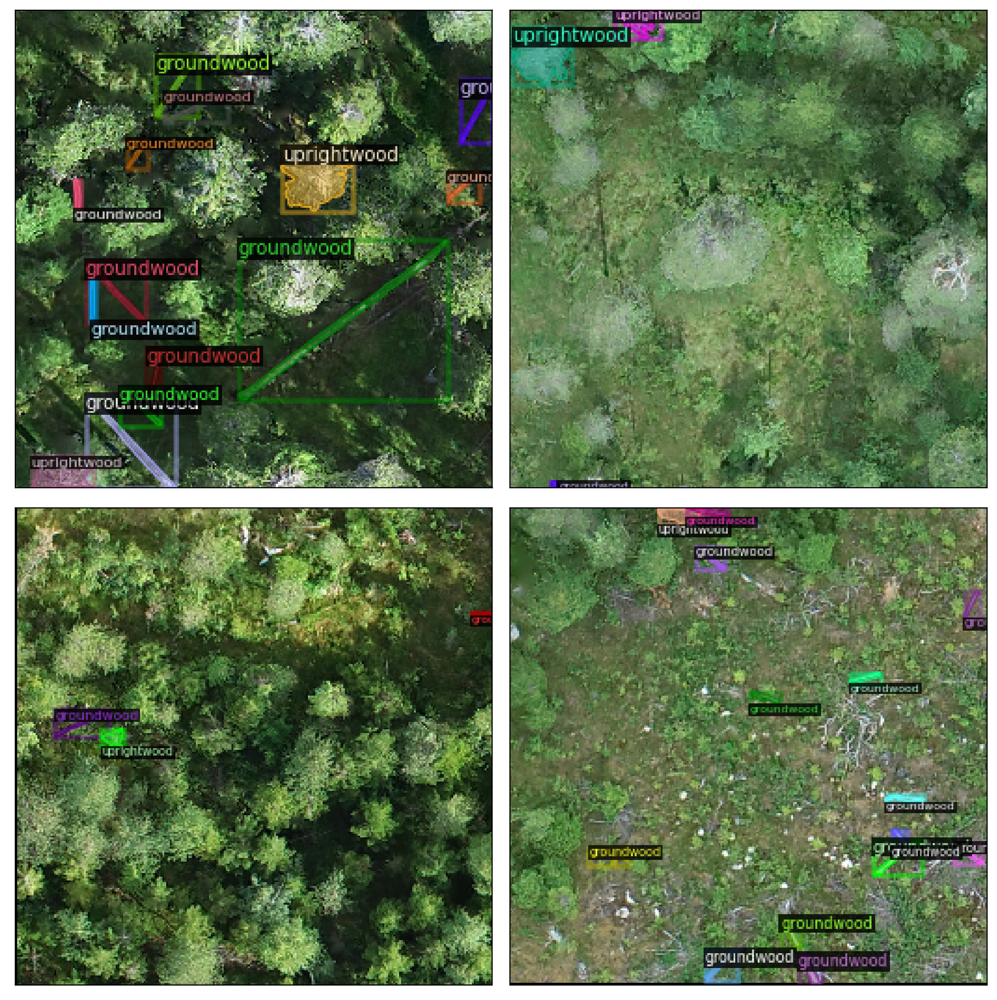

In [ ]:
import cv2
import matplotlib.pyplot as plt

dataset_dicts = DatasetCatalog.get('hiidenportti_train')
fig, axs = plt.subplots(2,2, dpi=300, figsize=(10,10))
for d, ax in zip(random.sample(dataset_dicts, 4), axs.flatten()):
    ax.set_xticks([])
    ax.set_yticks([])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get('hiidenportti_train'), scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    ax.imshow(out.get_image()[...,::-1][...,::-1])
plt.tight_layout()

In [ ]:
def build_train_aug(cfg):
    augs = [
        T.ResizeShortestEdge(
            cfg.INPUT.MIN_SIZE_TRAIN, cfg.INPUT.MAX_SIZE_TRAIN, cfg.INPUT.MIN_SIZE_TRAIN_SAMPLING
        ),
        T.RandomBrightness(0.8, 1.2),
        T.RandomContrast(0.8, 1.2),
        T.RandomSaturation(0.8, 1.2),
        T.RandomRotation(angle=[90, 90]),
        T.RandomFlip(prob=0.5, horizontal=False, vertical=True),
        T.RandomFlip(prob=0.5, horizontal=True, vertical=False)

    ]
    return augs

class Trainer(DefaultTrainer):
    """
    Modified DefaultTrainer
    """

    @classmethod
    def build_evaluator(cls, cfg, dataset_name, output_folder=None):
        return DatasetEvaluators([COCOEvaluator(dataset_name, output_dir=output_folder)])
    
    @classmethod
    def build_train_loader(cls, cfg):
        return build_detection_train_loader(cfg, mapper=DatasetMapper(cfg, is_train=True, augmentations=build_train_aug(cfg)))

In [ ]:

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
#cfg.MODEL.ANCHOR_GENERATOR.SIZES = [[16,32,64,128,256]]
#cfg.MODEL.ANCHOR_GENERATOR.ASPECT_RATIOS = [[0.25,0.5,1,2,4]]
cfg.DATASETS.TRAIN = ("hiidenportti_train",)
cfg.DATASETS.TEST = ("hiidenportti_val",)
cfg.DATALOADER.NUM_WORKERS = 4
#cfg.INPUT.MIN_SIZE_TRAIN=(384,416,448,480,512)
#cfg.INPUT.MAX_SIZE_TRAIN=512
#cfg.INPUT.MIN_SIZE_TEST=512
#cfg.INPUT.MAX_SIZE_TEST=512
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 8
cfg.TEST.EVAL_PERIOD = 100
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
cfg.OUTPUT_DIR = 'detectron2_models/resnet_R_50_baseline_aug'

cfg.SOLVER.LR_SCHEDULER_NAME = "WarmupCosineLR"
cfg.SOLVER.BASE_LR = 0.001  # pick a good LR
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 10000 
#cfg.SOLVER.STEPS = []        # do not decay learning rate
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2
# NOTE: this config means the number of classes, but a few popular unofficial tutorials incorrect uses num_classes+1 here.

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

In [ ]:
import yaml
wandb.login()
cfg_wandb = yaml.safe_load(cfg.dump())
wandb.init(project='hiidenportti-deadwood', 
           name='mask_rcnn_resnet_R_50_FPN_3x_10k_aug',
           sync_tensorboard=True, 
           config=cfg_wandb)

wandb: wandb version 0.12.9 is available!  To upgrade, please run:
wandb:  $ pip install wandb --upgrade


In [ ]:
trainer = Trainer(cfg) 
trainer.resume_or_load(resume=False)


[12/23 14:43:54 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

[12/23 14:43:54 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in training: [ResizeShortestEdge(short_edge_length=(640, 672, 704, 736, 768, 800), max_size=1333, sample_style='choice'), RandomBrightness(intensity_min=0.8, intensity_max=1.2), RandomContrast(intensity_min=0.8, intensity_max=1.2), RandomSaturation(intensity_min=0.8, intensity_max=1.2), RandomRotation(angle=[90, 90]), RandomFlip(prob=0.5, horizontal=False, vertical=True), RandomFlip(prob=0.5)]
[12/23 14:43:54 d2.data.datasets.coco]: Loaded 753 images in COCO format from ../data/hiidenportti/processed/hiidenportti_train.json
[12/23 14:43:54 d2.data.build]: Removed 0 images with no usable annotations. 753 images left.
[12/23 14:43:54 d2.data.build]: Distribution of instances among all 2 categories:
|  category   | #instances   |  category  | #instances   |
|:-----------:|:-------------|:----------:|:-------------|
| uprightwood | 638          | groundwood | 5429         |
|             |              |           

In [ ]:
trainer.train()

[12/23 09:57:11 d2.engine.train_loop]: Starting training from iteration 0
[12/23 09:57:24 d2.utils.events]:  eta: 1:38:55  iter: 19  total_loss: 3.973  loss_cls: 1.24  loss_box_reg: 0.07297  loss_mask: 0.6908  loss_rpn_cls: 1.788  loss_rpn_loc: 0.1704  time: 0.5905  data_time: 0.0890  lr: 1.9516e-05  max_mem: 9810M
[12/23 09:57:36 d2.utils.events]:  eta: 1:38:43  iter: 39  total_loss: 2.326  loss_cls: 0.697  loss_box_reg: 0.1044  loss_mask: 0.6731  loss_rpn_cls: 0.7219  loss_rpn_loc: 0.1487  time: 0.5898  data_time: 0.0404  lr: 3.9007e-05  max_mem: 9810M
[12/23 09:57:48 d2.utils.events]:  eta: 1:39:36  iter: 59  total_loss: 1.776  loss_cls: 0.3903  loss_box_reg: 0.1803  loss_mask: 0.6227  loss_rpn_cls: 0.3451  loss_rpn_loc: 0.1725  time: 0.6016  data_time: 0.0408  lr: 5.8497e-05  max_mem: 9810M
[12/23 09:58:00 d2.utils.events]:  eta: 1:40:47  iter: 79  total_loss: 1.442  loss_cls: 0.2944  loss_box_reg: 0.2435  loss_mask: 0.553  loss_rpn_cls: 0.1744  loss_rpn_loc: 0.1307  time: 0.6044  

[12/23 09:59:27 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 09:59:27 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP    | category   | AP    |
|:------------|:------|:-----------|:------|
| uprightwood | 0.000 | groundwood | 9.982 |
[12/23 09:59:27 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 09:59:27 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 09:59:27 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 09:59:27 d2.evaluation.testing]: copypaste: 7.3455,14.2162,6.2141,10.1788,0.9109,nan
[12/23 09:59:27 d2.evaluation.testing]: copypaste: Task: segm
[12/23 09:59:27 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 09:59:27 d2.evaluation.testing]: copypaste: 4.9911,13.6872,2.3033,5.0183,4.9788,nan
[12/23 09:59:27 d2.utils.events]:  eta: 1:40:34  iter: 199  total_loss: 1.061  loss_cls: 0.229  loss_box_reg: 0.3275  loss_mask: 0.2751  loss_

[12/23 10:00:49 d2.utils.events]:  eta: 1:39:59  iter: 319  total_loss: 0.9095  loss_cls: 0.196  loss_box_reg: 0.2759  loss_mask: 0.2259  loss_rpn_cls: 0.08104  loss_rpn_loc: 0.1056  time: 0.6235  data_time: 0.0416  lr: 0.00031187  max_mem: 9810M
[12/23 10:01:02 d2.utils.events]:  eta: 1:39:51  iter: 339  total_loss: 0.9233  loss_cls: 0.2105  loss_box_reg: 0.3007  loss_mask: 0.2194  loss_rpn_cls: 0.07679  loss_rpn_loc: 0.1098  time: 0.6248  data_time: 0.0418  lr: 0.00033137  max_mem: 9810M
[12/23 10:01:15 d2.utils.events]:  eta: 1:39:39  iter: 359  total_loss: 0.8902  loss_cls: 0.1979  loss_box_reg: 0.2671  loss_mask: 0.2247  loss_rpn_cls: 0.07467  loss_rpn_loc: 0.1208  time: 0.6249  data_time: 0.0348  lr: 0.00035086  max_mem: 9810M
[12/23 10:01:28 d2.utils.events]:  eta: 1:39:29  iter: 379  total_loss: 0.8818  loss_cls: 0.1911  loss_box_reg: 0.2693  loss_mask: 0.2173  loss_rpn_cls: 0.0726  loss_rpn_loc: 0.1119  time: 0.6254  data_time: 0.0439  lr: 0.00037035  max_mem: 9810M
[12/23 10:

[12/23 10:02:51 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 10:02:51 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 10:02:51 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:02:51 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:02:51 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 10:02:52 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0005 s/iter. Inference: 0.0362 s/iter. Eval: 0.0040 s/iter. Total: 0.0406 s/iter. ETA=0:00:05
[12/23 10:02:57 d2.evaluation.evaluator]: Inference done 137/140. Dataloading: 0.0008 s/iter. Inference: 0.0356 s/iter. Eval: 0.0034 s/iter. Total: 0.0399 s/iter. ETA=0:00:00
[12/23 10:02:57 d2.evaluation.evaluator]: Total inference time: 0:00:05.409454 (0.040070 s / ite

[12/23 10:04:07 d2.evaluation.evaluator]: Total inference time: 0:00:05.430700 (0.040227 s / iter per device, on 1 devices)
[12/23 10:04:07 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.035642 s / iter per device, on 1 devices)
[12/23 10:04:07 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:04:07 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 10:04:07 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 10:04:07 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 10:04:07 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:04:07 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.234
 Average Precision  (AP) @[ IoU=0.50      | are

[12/23 10:05:18 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.253
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.483
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.217
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.238
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.145
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.170
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.380
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.389
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.300
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.427
 Average Recall     (

[12/23 10:06:28 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:06:28 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 24.965 | groundwood | 31.598 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 10:06:28 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 10:06:28 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[12/23 10:06:28 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:06:28 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.242
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.526
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.184
 Average Prec

[12/23 10:07:39 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:07:39 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 27.353 | groundwood | 24.055 |
[12/23 10:07:39 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 10:07:39 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 10:07:39 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:07:39 d2.evaluation.testing]: copypaste: 29.9880,54.5031,28.4157,27.6815,19.0929,nan
[12/23 10:07:39 d2.evaluation.testing]: copypaste: Task: segm
[12/23 10:07:39 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:07:39 d2.evaluation.testing]: copypaste: 25.7039,54.8538,19.1847,16.4190,26.8296,nan
[12/23 10:07:39 d2.utils.events]:  eta: 1:36:12  iter: 899  total_loss: 0.7577  loss_cls: 0.1641  loss_box_reg: 0.247  loss_mask:

[12/23 10:08:51 d2.evaluation.testing]: copypaste: 25.9234,56.2339,19.1339,18.4899,24.1695,nan
[12/23 10:08:51 d2.utils.events]:  eta: 1:35:22  iter: 999  total_loss: 0.7608  loss_cls: 0.1671  loss_box_reg: 0.2481  loss_mask: 0.1926  loss_rpn_cls: 0.05284  loss_rpn_loc: 0.08918  time: 0.6358  data_time: 0.0530  lr: 0.00097455  max_mem: 9810M
[12/23 10:09:04 d2.utils.events]:  eta: 1:35:18  iter: 1019  total_loss: 0.7513  loss_cls: 0.1629  loss_box_reg: 0.2285  loss_mask: 0.1933  loss_rpn_cls: 0.04999  loss_rpn_loc: 0.1081  time: 0.6359  data_time: 0.0449  lr: 0.0009746  max_mem: 9810M
[12/23 10:09:17 d2.utils.events]:  eta: 1:35:14  iter: 1039  total_loss: 0.8841  loss_cls: 0.2062  loss_box_reg: 0.2908  loss_mask: 0.1881  loss_rpn_cls: 0.05561  loss_rpn_loc: 0.1238  time: 0.6364  data_time: 0.0455  lr: 0.0009736  max_mem: 9810M
[12/23 10:09:30 d2.utils.events]:  eta: 1:35:16  iter: 1059  total_loss: 0.7995  loss_cls: 0.1998  loss_box_reg: 0.2714  loss_mask: 0.1752  loss_rpn_cls: 0.0496

[12/23 10:10:42 d2.utils.events]:  eta: 1:34:41  iter: 1159  total_loss: 0.7535  loss_cls: 0.1727  loss_box_reg: 0.2432  loss_mask: 0.1849  loss_rpn_cls: 0.04223  loss_rpn_loc: 0.1063  time: 0.6380  data_time: 0.0422  lr: 0.00096722  max_mem: 9810M
[12/23 10:10:54 d2.utils.events]:  eta: 1:34:28  iter: 1179  total_loss: 0.8028  loss_cls: 0.1707  loss_box_reg: 0.2398  loss_mask: 0.1857  loss_rpn_cls: 0.05166  loss_rpn_loc: 0.1055  time: 0.6380  data_time: 0.0420  lr: 0.00096609  max_mem: 9810M
[12/23 10:11:07 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 10:11:07 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 10:11:07 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:11:07 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:11:08 d2.e

[12/23 10:12:19 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:12:19 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:12:19 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 10:12:20 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0005 s/iter. Inference: 0.0353 s/iter. Eval: 0.0032 s/iter. Total: 0.0391 s/iter. ETA=0:00:05
[12/23 10:12:25 d2.evaluation.evaluator]: Inference done 140/140. Dataloading: 0.0008 s/iter. Inference: 0.0350 s/iter. Eval: 0.0032 s/iter. Total: 0.0390 s/iter. ETA=0:00:00
[12/23 10:12:26 d2.evaluation.evaluator]: Total inference time: 0:00:05.317200 (0.039387 s / iter per device, on 1 devices)
[12/23 10:12:26 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.035010 s / iter per device, on 1 devices)
[12/23 10:12:26 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:12:26 d2.evaluation.coco_evaluation]: Evaluating predict

[12/23 10:13:38 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:13:38 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 10:13:38 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 10:13:38 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 10:13:38 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:13:38 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.332
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.580
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.323
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.299
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | max

[12/23 10:14:49 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:14:49 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 32.436 | groundwood | 34.293 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 10:14:49 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 10:14:49 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[12/23 10:14:49 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:14:49 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.289
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.602
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.232
 Average Prec

[12/23 10:16:01 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:16:01 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 29.006 | groundwood | 26.723 |
[12/23 10:16:01 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 10:16:01 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 10:16:01 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:16:01 d2.evaluation.testing]: copypaste: 32.1883,56.5288,30.2895,27.3818,22.1911,nan
[12/23 10:16:01 d2.evaluation.testing]: copypaste: Task: segm
[12/23 10:16:01 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:16:01 d2.evaluation.testing]: copypaste: 27.8643,58.2787,21.8349,18.7267,29.0021,nan
[12/23 10:16:01 d2.utils.events]:  eta: 1:30:41  iter: 1599  total_loss: 0.7554  loss_cls: 0.185  loss_box_reg: 0.2587  loss_mask

[12/23 10:17:13 d2.evaluation.testing]: copypaste: 27.9672,59.7439,21.3000,18.3620,29.7354,nan
[12/23 10:17:13 d2.utils.events]:  eta: 1:29:45  iter: 1699  total_loss: 0.7606  loss_cls: 0.1676  loss_box_reg: 0.2481  loss_mask: 0.187  loss_rpn_cls: 0.04513  loss_rpn_loc: 0.09294  time: 0.6430  data_time: 0.0472  lr: 0.00093045  max_mem: 9810M
[12/23 10:17:27 d2.utils.events]:  eta: 1:29:42  iter: 1719  total_loss: 0.7048  loss_cls: 0.1608  loss_box_reg: 0.2428  loss_mask: 0.177  loss_rpn_cls: 0.03923  loss_rpn_loc: 0.07879  time: 0.6433  data_time: 0.0545  lr: 0.00092884  max_mem: 9810M
[12/23 10:17:40 d2.utils.events]:  eta: 1:29:30  iter: 1739  total_loss: 0.6941  loss_cls: 0.16  loss_box_reg: 0.2199  loss_mask: 0.1874  loss_rpn_cls: 0.03927  loss_rpn_loc: 0.09205  time: 0.6435  data_time: 0.0448  lr: 0.00092722  max_mem: 9810M
[12/23 10:17:53 d2.utils.events]:  eta: 1:29:24  iter: 1759  total_loss: 0.716  loss_cls: 0.1697  loss_box_reg: 0.2427  loss_mask: 0.1764  loss_rpn_cls: 0.0417

[12/23 10:19:05 d2.utils.events]:  eta: 1:28:29  iter: 1859  total_loss: 0.6807  loss_cls: 0.1519  loss_box_reg: 0.2321  loss_mask: 0.172  loss_rpn_cls: 0.03644  loss_rpn_loc: 0.08171  time: 0.6442  data_time: 0.0431  lr: 0.00091713  max_mem: 9810M
[12/23 10:19:18 d2.utils.events]:  eta: 1:28:14  iter: 1879  total_loss: 0.6798  loss_cls: 0.1597  loss_box_reg: 0.2314  loss_mask: 0.1845  loss_rpn_cls: 0.0391  loss_rpn_loc: 0.08405  time: 0.6441  data_time: 0.0404  lr: 0.00091539  max_mem: 9810M
[12/23 10:19:31 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 10:19:31 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 10:19:31 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:19:31 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:19:31 d2.e

[12/23 10:20:43 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:20:43 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:20:43 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 10:20:44 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0005 s/iter. Inference: 0.0361 s/iter. Eval: 0.0035 s/iter. Total: 0.0401 s/iter. ETA=0:00:05
[12/23 10:20:49 d2.evaluation.evaluator]: Inference done 137/140. Dataloading: 0.0008 s/iter. Inference: 0.0356 s/iter. Eval: 0.0034 s/iter. Total: 0.0399 s/iter. ETA=0:00:00
[12/23 10:20:49 d2.evaluation.evaluator]: Total inference time: 0:00:05.413049 (0.040097 s / iter per device, on 1 devices)
[12/23 10:20:49 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.035542 s / iter per device, on 1 devices)
[12/23 10:20:49 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:20:49 d2.evaluation.coco_evaluation]: Evaluating predict

[12/23 10:22:01 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:22:01 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 10:22:01 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 10:22:01 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 10:22:01 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:22:01 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.349
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.605
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.333
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.293
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | max

[12/23 10:23:13 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:23:13 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 31.031 | groundwood | 35.240 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 10:23:13 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 10:23:13 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[12/23 10:23:13 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:23:13 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.284
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.601
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.225
 Average Prec

[12/23 10:24:26 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:24:26 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 31.501 | groundwood | 27.847 |
[12/23 10:24:26 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 10:24:26 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 10:24:26 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:24:26 d2.evaluation.testing]: copypaste: 35.1311,60.3428,33.9440,30.3105,25.0079,nan
[12/23 10:24:26 d2.evaluation.testing]: copypaste: Task: segm
[12/23 10:24:26 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:24:26 d2.evaluation.testing]: copypaste: 29.6740,61.8245,22.1564,20.3122,29.4195,nan
[12/23 10:24:26 d2.utils.events]:  eta: 1:24:06  iter: 2299  total_loss: 0.6896  loss_cls: 0.1699  loss_box_reg: 0.2305  loss_mas

[12/23 10:25:37 d2.evaluation.testing]: copypaste: 29.8111,62.8862,22.7336,19.3989,31.2107,nan
[12/23 10:25:37 d2.utils.events]:  eta: 1:23:01  iter: 2399  total_loss: 0.6335  loss_cls: 0.1552  loss_box_reg: 0.2148  loss_mask: 0.1624  loss_rpn_cls: 0.02796  loss_rpn_loc: 0.06716  time: 0.6469  data_time: 0.0441  lr: 0.00086459  max_mem: 9810M
[12/23 10:25:51 d2.utils.events]:  eta: 1:22:46  iter: 2419  total_loss: 0.6953  loss_cls: 0.1644  loss_box_reg: 0.2393  loss_mask: 0.1786  loss_rpn_cls: 0.03194  loss_rpn_loc: 0.08201  time: 0.6470  data_time: 0.0431  lr: 0.00086243  max_mem: 9810M
[12/23 10:26:04 d2.utils.events]:  eta: 1:22:39  iter: 2439  total_loss: 0.6933  loss_cls: 0.1581  loss_box_reg: 0.2356  loss_mask: 0.1766  loss_rpn_cls: 0.03196  loss_rpn_loc: 0.08836  time: 0.6472  data_time: 0.0511  lr: 0.00086026  max_mem: 9810M
[12/23 10:26:17 d2.utils.events]:  eta: 1:22:30  iter: 2459  total_loss: 0.6885  loss_cls: 0.1605  loss_box_reg: 0.2396  loss_mask: 0.1753  loss_rpn_cls: 0

[12/23 10:27:29 d2.utils.events]:  eta: 1:21:28  iter: 2559  total_loss: 0.6759  loss_cls: 0.1599  loss_box_reg: 0.2406  loss_mask: 0.1715  loss_rpn_cls: 0.02986  loss_rpn_loc: 0.08002  time: 0.6476  data_time: 0.0389  lr: 0.00084694  max_mem: 9810M
[12/23 10:27:42 d2.utils.events]:  eta: 1:21:15  iter: 2579  total_loss: 0.7123  loss_cls: 0.1637  loss_box_reg: 0.2388  loss_mask: 0.1763  loss_rpn_cls: 0.03193  loss_rpn_loc: 0.08316  time: 0.6476  data_time: 0.0406  lr: 0.00084467  max_mem: 9810M
[12/23 10:27:56 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 10:27:56 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 10:27:56 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:27:56 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:27:56 d2

[12/23 10:29:09 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:29:09 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:29:09 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 10:29:10 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0006 s/iter. Inference: 0.0369 s/iter. Eval: 0.0035 s/iter. Total: 0.0410 s/iter. ETA=0:00:05
[12/23 10:29:15 d2.evaluation.evaluator]: Inference done 138/140. Dataloading: 0.0008 s/iter. Inference: 0.0354 s/iter. Eval: 0.0032 s/iter. Total: 0.0395 s/iter. ETA=0:00:00
[12/23 10:29:15 d2.evaluation.evaluator]: Total inference time: 0:00:05.361211 (0.039713 s / iter per device, on 1 devices)
[12/23 10:29:15 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.035363 s / iter per device, on 1 devices)
[12/23 10:29:15 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:29:15 d2.evaluation.coco_evaluation]: Evaluating predict

[12/23 10:30:27 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:30:27 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 10:30:27 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 10:30:27 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 10:30:27 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:30:27 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.353
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.611
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.348
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.297
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | max

[12/23 10:31:40 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:31:40 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 33.494 | groundwood | 35.616 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 10:31:40 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 10:31:40 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[12/23 10:31:40 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:31:40 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.297
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.610
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.240
 Average Prec

[12/23 10:32:52 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:32:52 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 31.028 | groundwood | 28.520 |
[12/23 10:32:52 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 10:32:52 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 10:32:52 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:32:52 d2.evaluation.testing]: copypaste: 35.2092,61.7782,36.9538,29.9468,25.8355,nan
[12/23 10:32:52 d2.evaluation.testing]: copypaste: Task: segm
[12/23 10:32:52 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:32:52 d2.evaluation.testing]: copypaste: 29.7739,63.1331,22.7713,19.5390,31.3036,nan
[12/23 10:32:52 d2.utils.events]:  eta: 1:16:57  iter: 2999  total_loss: 0.6536  loss_cls: 0.1401  loss_box_reg: 0.2136  loss_mas

[12/23 10:34:05 d2.evaluation.testing]: copypaste: 29.7587,60.5750,23.9871,19.2727,30.4769,nan
[12/23 10:34:05 d2.utils.events]:  eta: 1:15:52  iter: 3099  total_loss: 0.7112  loss_cls: 0.1583  loss_box_reg: 0.2218  loss_mask: 0.1799  loss_rpn_cls: 0.03189  loss_rpn_loc: 0.08841  time: 0.6499  data_time: 0.0441  lr: 0.00078117  max_mem: 9810M
[12/23 10:34:18 d2.utils.events]:  eta: 1:15:39  iter: 3119  total_loss: 0.6714  loss_cls: 0.1599  loss_box_reg: 0.2369  loss_mask: 0.1663  loss_rpn_cls: 0.0332  loss_rpn_loc: 0.08678  time: 0.6501  data_time: 0.0402  lr: 0.00077857  max_mem: 9810M
[12/23 10:34:32 d2.utils.events]:  eta: 1:15:26  iter: 3139  total_loss: 0.686  loss_cls: 0.1644  loss_box_reg: 0.2421  loss_mask: 0.1674  loss_rpn_cls: 0.02829  loss_rpn_loc: 0.08134  time: 0.6501  data_time: 0.0421  lr: 0.00077595  max_mem: 9810M
[12/23 10:34:45 d2.utils.events]:  eta: 1:15:12  iter: 3159  total_loss: 0.666  loss_cls: 0.1558  loss_box_reg: 0.2268  loss_mask: 0.169  loss_rpn_cls: 0.025

[12/23 10:35:58 d2.utils.events]:  eta: 1:14:06  iter: 3259  total_loss: 0.6496  loss_cls: 0.1478  loss_box_reg: 0.2183  loss_mask: 0.1716  loss_rpn_cls: 0.02812  loss_rpn_loc: 0.08428  time: 0.6506  data_time: 0.0362  lr: 0.00076004  max_mem: 9810M
[12/23 10:36:11 d2.utils.events]:  eta: 1:13:55  iter: 3279  total_loss: 0.7516  loss_cls: 0.1857  loss_box_reg: 0.2652  loss_mask: 0.1616  loss_rpn_cls: 0.03192  loss_rpn_loc: 0.08438  time: 0.6507  data_time: 0.0485  lr: 0.00075735  max_mem: 9810M
[12/23 10:36:24 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 10:36:24 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 10:36:24 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:36:24 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:36:24 d2

[12/23 10:37:37 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:37:37 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:37:37 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 10:37:39 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0006 s/iter. Inference: 0.0353 s/iter. Eval: 0.0037 s/iter. Total: 0.0395 s/iter. ETA=0:00:05
[12/23 10:37:44 d2.evaluation.evaluator]: Inference done 138/140. Dataloading: 0.0008 s/iter. Inference: 0.0351 s/iter. Eval: 0.0034 s/iter. Total: 0.0394 s/iter. ETA=0:00:00
[12/23 10:37:44 d2.evaluation.evaluator]: Total inference time: 0:00:05.353772 (0.039658 s / iter per device, on 1 devices)
[12/23 10:37:44 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.035084 s / iter per device, on 1 devices)
[12/23 10:37:44 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:37:44 d2.evaluation.coco_evaluation]: Evaluating predict

[12/23 10:38:57 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:38:57 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 10:38:57 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 10:38:57 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 10:38:57 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:38:57 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.354
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.611
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.352
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.304
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | max

[12/23 10:40:09 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:40:09 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 33.785 | groundwood | 36.066 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 10:40:09 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 10:40:09 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[12/23 10:40:09 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:40:09 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.300
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.627
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.245
 Average Prec

[12/23 10:41:22 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:41:22 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 31.493 | groundwood | 28.663 |
[12/23 10:41:22 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 10:41:22 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 10:41:22 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:41:22 d2.evaluation.testing]: copypaste: 35.3178,61.5101,37.2569,30.5936,27.1761,nan
[12/23 10:41:22 d2.evaluation.testing]: copypaste: Task: segm
[12/23 10:41:22 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:41:22 d2.evaluation.testing]: copypaste: 30.0779,62.5323,23.3617,20.4442,31.0412,nan
[12/23 10:41:22 d2.utils.events]:  eta: 1:09:42  iter: 3699  total_loss: 0.6401  loss_cls: 0.147  loss_box_reg: 0.213  loss_mask:

[12/23 10:42:35 d2.evaluation.testing]: copypaste: 29.5479,61.4053,23.9031,19.7696,30.5678,nan
[12/23 10:42:35 d2.utils.events]:  eta: 1:08:40  iter: 3799  total_loss: 0.6876  loss_cls: 0.1657  loss_box_reg: 0.2306  loss_mask: 0.1702  loss_rpn_cls: 0.02959  loss_rpn_loc: 0.07832  time: 0.6526  data_time: 0.0469  lr: 0.00068421  max_mem: 9810M
[12/23 10:42:48 d2.utils.events]:  eta: 1:08:25  iter: 3819  total_loss: 0.6384  loss_cls: 0.1483  loss_box_reg: 0.2035  loss_mask: 0.162  loss_rpn_cls: 0.02696  loss_rpn_loc: 0.07909  time: 0.6526  data_time: 0.0506  lr: 0.00068128  max_mem: 9810M
[12/23 10:43:02 d2.utils.events]:  eta: 1:08:11  iter: 3839  total_loss: 0.6877  loss_cls: 0.163  loss_box_reg: 0.2324  loss_mask: 0.1621  loss_rpn_cls: 0.03086  loss_rpn_loc: 0.08515  time: 0.6527  data_time: 0.0393  lr: 0.00067835  max_mem: 9810M
[12/23 10:43:15 d2.utils.events]:  eta: 1:07:58  iter: 3859  total_loss: 0.7069  loss_cls: 0.1634  loss_box_reg: 0.2375  loss_mask: 0.1657  loss_rpn_cls: 0.0

[12/23 10:44:28 d2.utils.events]:  eta: 1:06:56  iter: 3959  total_loss: 0.6771  loss_cls: 0.1553  loss_box_reg: 0.2382  loss_mask: 0.1812  loss_rpn_cls: 0.03002  loss_rpn_loc: 0.07291  time: 0.6531  data_time: 0.0482  lr: 0.00066062  max_mem: 9810M
[12/23 10:44:41 d2.utils.events]:  eta: 1:06:42  iter: 3979  total_loss: 0.6909  loss_cls: 0.1511  loss_box_reg: 0.2353  loss_mask: 0.1725  loss_rpn_cls: 0.02488  loss_rpn_loc: 0.07023  time: 0.6531  data_time: 0.0366  lr: 0.00065764  max_mem: 9810M
[12/23 10:44:54 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 10:44:54 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 10:44:54 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:44:54 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:44:54 d2

[12/23 10:46:07 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:46:07 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:46:07 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 10:46:08 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0006 s/iter. Inference: 0.0350 s/iter. Eval: 0.0033 s/iter. Total: 0.0389 s/iter. ETA=0:00:05
[12/23 10:46:13 d2.evaluation.evaluator]: Inference done 138/140. Dataloading: 0.0008 s/iter. Inference: 0.0353 s/iter. Eval: 0.0032 s/iter. Total: 0.0394 s/iter. ETA=0:00:00
[12/23 10:46:13 d2.evaluation.evaluator]: Total inference time: 0:00:05.356589 (0.039678 s / iter per device, on 1 devices)
[12/23 10:46:13 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.035304 s / iter per device, on 1 devices)
[12/23 10:46:13 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:46:13 d2.evaluation.coco_evaluation]: Evaluating predict

[12/23 10:47:27 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:47:27 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 10:47:27 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 10:47:27 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 10:47:27 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:47:27 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.358
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.627
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.371
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.322
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | max

[12/23 10:48:39 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:48:39 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 35.067 | groundwood | 36.396 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 10:48:39 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 10:48:39 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[12/23 10:48:39 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:48:39 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.303
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.620
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.246
 Average Prec

[12/23 10:49:53 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:49:53 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 31.479 | groundwood | 28.788 |
[12/23 10:49:53 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 10:49:53 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 10:49:53 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:49:53 d2.evaluation.testing]: copypaste: 35.5089,61.4219,37.0491,31.4347,28.0144,nan
[12/23 10:49:53 d2.evaluation.testing]: copypaste: Task: segm
[12/23 10:49:53 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:49:53 d2.evaluation.testing]: copypaste: 30.1334,62.2718,24.8249,20.8880,31.9611,nan
[12/23 10:49:53 d2.utils.events]:  eta: 1:02:12  iter: 4399  total_loss: 0.6637  loss_cls: 0.1551  loss_box_reg: 0.238  loss_mask

[12/23 10:51:06 d2.evaluation.testing]: copypaste: 30.2230,62.3895,25.2553,20.9091,32.2057,nan
[12/23 10:51:06 d2.utils.events]:  eta: 1:01:02  iter: 4499  total_loss: 0.6813  loss_cls: 0.1487  loss_box_reg: 0.2356  loss_mask: 0.1711  loss_rpn_cls: 0.02511  loss_rpn_loc: 0.08153  time: 0.6546  data_time: 0.0344  lr: 0.00057837  max_mem: 9810M
[12/23 10:51:19 d2.utils.events]:  eta: 1:00:49  iter: 4519  total_loss: 0.6755  loss_cls: 0.1624  loss_box_reg: 0.2453  loss_mask: 0.1729  loss_rpn_cls: 0.02716  loss_rpn_loc: 0.07707  time: 0.6547  data_time: 0.0475  lr: 0.00057527  max_mem: 9810M
[12/23 10:51:33 d2.utils.events]:  eta: 1:00:36  iter: 4539  total_loss: 0.6553  loss_cls: 0.1545  loss_box_reg: 0.2389  loss_mask: 0.161  loss_rpn_cls: 0.0281  loss_rpn_loc: 0.07501  time: 0.6548  data_time: 0.0490  lr: 0.00057216  max_mem: 9810M
[12/23 10:51:46 d2.utils.events]:  eta: 1:00:27  iter: 4559  total_loss: 0.6632  loss_cls: 0.1551  loss_box_reg: 0.2401  loss_mask: 0.1636  loss_rpn_cls: 0.0

[12/23 10:52:59 d2.utils.events]:  eta: 0:59:21  iter: 4659  total_loss: 0.659  loss_cls: 0.1488  loss_box_reg: 0.2405  loss_mask: 0.1667  loss_rpn_cls: 0.02634  loss_rpn_loc: 0.08068  time: 0.6551  data_time: 0.0512  lr: 0.00055346  max_mem: 9810M
[12/23 10:53:13 d2.utils.events]:  eta: 0:59:08  iter: 4679  total_loss: 0.6416  loss_cls: 0.1492  loss_box_reg: 0.2248  loss_mask: 0.1606  loss_rpn_cls: 0.02419  loss_rpn_loc: 0.07555  time: 0.6552  data_time: 0.0499  lr: 0.00055034  max_mem: 9810M
[12/23 10:53:26 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 10:53:26 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 10:53:26 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:53:26 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:53:26 d2.

[12/23 10:54:39 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 10:54:39 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 10:54:39 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 10:54:40 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0006 s/iter. Inference: 0.0358 s/iter. Eval: 0.0032 s/iter. Total: 0.0397 s/iter. ETA=0:00:05
[12/23 10:54:45 d2.evaluation.evaluator]: Inference done 139/140. Dataloading: 0.0008 s/iter. Inference: 0.0354 s/iter. Eval: 0.0029 s/iter. Total: 0.0392 s/iter. ETA=0:00:00
[12/23 10:54:45 d2.evaluation.evaluator]: Total inference time: 0:00:05.329220 (0.039476 s / iter per device, on 1 devices)
[12/23 10:54:45 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.035398 s / iter per device, on 1 devices)
[12/23 10:54:45 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:54:45 d2.evaluation.coco_evaluation]: Evaluating predict

[12/23 10:55:58 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 10:55:58 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 10:55:58 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 10:55:58 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 10:55:58 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:55:58 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.357
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.618
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.365
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.317
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | max

[12/23 10:57:13 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:57:13 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 31.675 | groundwood | 36.095 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 10:57:13 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 10:57:13 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[12/23 10:57:13 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 10:57:13 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.286
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.605
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.213
 Average Prec

[12/23 10:58:26 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 10:58:26 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 29.191 | groundwood | 28.509 |
[12/23 10:58:26 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 10:58:26 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 10:58:26 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:58:26 d2.evaluation.testing]: copypaste: 33.6401,59.0997,34.1325,30.2562,27.3247,nan
[12/23 10:58:26 d2.evaluation.testing]: copypaste: Task: segm
[12/23 10:58:26 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 10:58:26 d2.evaluation.testing]: copypaste: 28.8499,60.1328,23.5556,20.0045,30.9917,nan
[12/23 10:58:26 d2.utils.events]:  eta: 0:54:30  iter: 5099  total_loss: 0.6474  loss_cls: 0.1616  loss_box_reg: 0.2326  loss_mas

[12/23 10:59:39 d2.evaluation.testing]: copypaste: 29.3759,61.8261,23.3289,20.0492,30.9018,nan
[12/23 10:59:39 d2.utils.events]:  eta: 0:53:25  iter: 5199  total_loss: 0.6109  loss_cls: 0.1415  loss_box_reg: 0.2216  loss_mask: 0.1654  loss_rpn_cls: 0.02062  loss_rpn_loc: 0.05353  time: 0.6565  data_time: 0.0524  lr: 0.00046876  max_mem: 9810M
[12/23 10:59:52 d2.utils.events]:  eta: 0:53:12  iter: 5219  total_loss: 0.6605  loss_cls: 0.1604  loss_box_reg: 0.2313  loss_mask: 0.1628  loss_rpn_cls: 0.02135  loss_rpn_loc: 0.07178  time: 0.6566  data_time: 0.0420  lr: 0.00046563  max_mem: 9810M
[12/23 11:00:06 d2.utils.events]:  eta: 0:52:59  iter: 5239  total_loss: 0.7197  loss_cls: 0.1732  loss_box_reg: 0.2581  loss_mask: 0.1621  loss_rpn_cls: 0.0245  loss_rpn_loc: 0.08611  time: 0.6566  data_time: 0.0384  lr: 0.00046249  max_mem: 9810M
[12/23 11:00:19 d2.utils.events]:  eta: 0:52:45  iter: 5259  total_loss: 0.6345  loss_cls: 0.147  loss_box_reg: 0.2375  loss_mask: 0.1595  loss_rpn_cls: 0.0

[12/23 11:01:32 d2.utils.events]:  eta: 0:51:42  iter: 5359  total_loss: 0.6167  loss_cls: 0.1434  loss_box_reg: 0.2204  loss_mask: 0.1651  loss_rpn_cls: 0.02233  loss_rpn_loc: 0.06276  time: 0.6569  data_time: 0.0523  lr: 0.00044373  max_mem: 9810M
[12/23 11:01:46 d2.utils.events]:  eta: 0:51:28  iter: 5379  total_loss: 0.6261  loss_cls: 0.1334  loss_box_reg: 0.2283  loss_mask: 0.1702  loss_rpn_cls: 0.02388  loss_rpn_loc: 0.08802  time: 0.6569  data_time: 0.0455  lr: 0.00044061  max_mem: 9810M
[12/23 11:01:59 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 11:01:59 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 11:01:59 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 11:01:59 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 11:01:59 d2

[12/23 11:03:11 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 11:03:11 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 11:03:11 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 11:03:12 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0005 s/iter. Inference: 0.0358 s/iter. Eval: 0.0031 s/iter. Total: 0.0395 s/iter. ETA=0:00:05
[12/23 11:03:17 d2.evaluation.evaluator]: Inference done 140/140. Dataloading: 0.0008 s/iter. Inference: 0.0353 s/iter. Eval: 0.0029 s/iter. Total: 0.0390 s/iter. ETA=0:00:00
[12/23 11:03:17 d2.evaluation.evaluator]: Total inference time: 0:00:05.307728 (0.039317 s / iter per device, on 1 devices)
[12/23 11:03:17 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.035285 s / iter per device, on 1 devices)
[12/23 11:03:17 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 11:03:17 d2.evaluation.coco_evaluation]: Evaluating predict

[12/23 11:04:31 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 11:04:31 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 11:04:31 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 11:04:31 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 11:04:31 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:04:31 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.345
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.599
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.364
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.275
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | max

[12/23 11:05:43 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:05:43 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 33.478 | groundwood | 36.402 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 11:05:43 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 11:05:43 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[12/23 11:05:43 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:05:43 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.298
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.618
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.252
 Average Prec

[12/23 11:06:55 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:06:55 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 30.479 | groundwood | 29.596 |
[12/23 11:06:55 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 11:06:55 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 11:06:55 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:06:55 d2.evaluation.testing]: copypaste: 35.2207,61.8798,36.2788,30.9378,26.6449,nan
[12/23 11:06:55 d2.evaluation.testing]: copypaste: Task: segm
[12/23 11:06:55 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:06:55 d2.evaluation.testing]: copypaste: 30.0372,62.4483,24.3195,21.0922,30.9566,nan
[12/23 11:06:55 d2.utils.events]:  eta: 0:46:34  iter: 5799  total_loss: 0.6716  loss_cls: 0.1621  loss_box_reg: 0.2414  loss_mas

[12/23 11:08:08 d2.evaluation.testing]: copypaste: 29.6349,61.4714,23.3481,20.6596,31.0900,nan
[12/23 11:08:08 d2.utils.events]:  eta: 0:45:26  iter: 5899  total_loss: 0.6602  loss_cls: 0.1415  loss_box_reg: 0.2309  loss_mask: 0.1707  loss_rpn_cls: 0.0251  loss_rpn_loc: 0.07739  time: 0.6573  data_time: 0.0437  lr: 0.00036066  max_mem: 9810M
[12/23 11:08:21 d2.utils.events]:  eta: 0:45:13  iter: 5919  total_loss: 0.6568  loss_cls: 0.1623  loss_box_reg: 0.2374  loss_mask: 0.1569  loss_rpn_cls: 0.02468  loss_rpn_loc: 0.06789  time: 0.6573  data_time: 0.0459  lr: 0.00035764  max_mem: 9810M
[12/23 11:08:35 d2.utils.events]:  eta: 0:45:00  iter: 5939  total_loss: 0.6015  loss_cls: 0.149  loss_box_reg: 0.2357  loss_mask: 0.1602  loss_rpn_cls: 0.0193  loss_rpn_loc: 0.05261  time: 0.6574  data_time: 0.0494  lr: 0.00035463  max_mem: 9810M
[12/23 11:08:48 d2.utils.events]:  eta: 0:44:46  iter: 5959  total_loss: 0.6397  loss_cls: 0.1526  loss_box_reg: 0.2277  loss_mask: 0.1596  loss_rpn_cls: 0.02

[12/23 11:10:01 d2.utils.events]:  eta: 0:43:40  iter: 6059  total_loss: 0.6324  loss_cls: 0.1446  loss_box_reg: 0.2368  loss_mask: 0.1615  loss_rpn_cls: 0.02477  loss_rpn_loc: 0.07181  time: 0.6576  data_time: 0.0466  lr: 0.0003367  max_mem: 9810M
[12/23 11:10:14 d2.utils.events]:  eta: 0:43:28  iter: 6079  total_loss: 0.6378  loss_cls: 0.1512  loss_box_reg: 0.2308  loss_mask: 0.156  loss_rpn_cls: 0.01924  loss_rpn_loc: 0.07324  time: 0.6576  data_time: 0.0482  lr: 0.00033374  max_mem: 9810M
[12/23 11:10:28 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 11:10:28 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 11:10:28 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 11:10:28 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 11:10:28 d2.e

[12/23 11:11:41 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 11:11:41 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 11:11:41 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 11:11:42 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0006 s/iter. Inference: 0.0367 s/iter. Eval: 0.0036 s/iter. Total: 0.0410 s/iter. ETA=0:00:05
[12/23 11:11:47 d2.evaluation.evaluator]: Inference done 139/140. Dataloading: 0.0009 s/iter. Inference: 0.0354 s/iter. Eval: 0.0032 s/iter. Total: 0.0394 s/iter. ETA=0:00:00
[12/23 11:11:47 d2.evaluation.evaluator]: Total inference time: 0:00:05.359855 (0.039703 s / iter per device, on 1 devices)
[12/23 11:11:47 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.035327 s / iter per device, on 1 devices)
[12/23 11:11:47 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 11:11:47 d2.evaluation.coco_evaluation]: Evaluating predict

[12/23 11:13:00 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 11:13:00 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 11:13:00 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 11:13:00 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 11:13:00 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:13:00 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.345
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.615
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.336
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.312
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | max

[12/23 11:14:14 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:14:14 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 33.955 | groundwood | 35.871 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 11:14:14 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 11:14:14 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.03 seconds.
[12/23 11:14:14 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:14:14 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.293
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.617
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.234
 Average Prec

[12/23 11:15:27 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:15:27 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 29.913 | groundwood | 28.714 |
[12/23 11:15:27 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 11:15:27 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 11:15:27 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:15:27 d2.evaluation.testing]: copypaste: 34.2796,60.3016,35.0206,28.3121,28.0484,nan
[12/23 11:15:27 d2.evaluation.testing]: copypaste: Task: segm
[12/23 11:15:27 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:15:27 d2.evaluation.testing]: copypaste: 29.3136,61.5625,23.8497,19.1502,31.2470,nan
[12/23 11:15:27 d2.utils.events]:  eta: 0:38:49  iter: 6499  total_loss: 0.5826  loss_cls: 0.1411  loss_box_reg: 0.2224  loss_mas

[12/23 11:16:40 d2.evaluation.testing]: copypaste: 29.4978,61.9084,22.9461,19.9399,31.7057,nan
[12/23 11:16:40 d2.utils.events]:  eta: 0:37:44  iter: 6599  total_loss: 0.6585  loss_cls: 0.1571  loss_box_reg: 0.2452  loss_mask: 0.1632  loss_rpn_cls: 0.02323  loss_rpn_loc: 0.06989  time: 0.6585  data_time: 0.0471  lr: 0.00025926  max_mem: 9810M
[12/23 11:16:54 d2.utils.events]:  eta: 0:37:31  iter: 6619  total_loss: 0.6543  loss_cls: 0.1572  loss_box_reg: 0.2529  loss_mask: 0.1589  loss_rpn_cls: 0.0222  loss_rpn_loc: 0.06321  time: 0.6585  data_time: 0.0428  lr: 0.00025651  max_mem: 9810M
[12/23 11:17:07 d2.utils.events]:  eta: 0:37:19  iter: 6639  total_loss: 0.6514  loss_cls: 0.1494  loss_box_reg: 0.2404  loss_mask: 0.1602  loss_rpn_cls: 0.02134  loss_rpn_loc: 0.07157  time: 0.6586  data_time: 0.0456  lr: 0.00025377  max_mem: 9810M
[12/23 11:17:21 d2.utils.events]:  eta: 0:37:07  iter: 6659  total_loss: 0.6259  loss_cls: 0.1479  loss_box_reg: 0.2272  loss_mask: 0.1699  loss_rpn_cls: 0.

[12/23 11:18:33 d2.utils.events]:  eta: 0:36:04  iter: 6759  total_loss: 0.6311  loss_cls: 0.1418  loss_box_reg: 0.2227  loss_mask: 0.1644  loss_rpn_cls: 0.02122  loss_rpn_loc: 0.0788  time: 0.6587  data_time: 0.0473  lr: 0.00023755  max_mem: 9810M
[12/23 11:18:47 d2.utils.events]:  eta: 0:35:50  iter: 6779  total_loss: 0.6266  loss_cls: 0.1421  loss_box_reg: 0.2203  loss_mask: 0.1618  loss_rpn_cls: 0.02374  loss_rpn_loc: 0.06835  time: 0.6587  data_time: 0.0370  lr: 0.00023488  max_mem: 9810M
[12/23 11:19:00 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 11:19:00 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 11:19:00 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 11:19:00 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 11:19:00 d2.

[12/23 11:20:12 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 11:20:12 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 11:20:12 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 11:20:14 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0006 s/iter. Inference: 0.0350 s/iter. Eval: 0.0033 s/iter. Total: 0.0388 s/iter. ETA=0:00:05
[12/23 11:20:19 d2.evaluation.evaluator]: Inference done 139/140. Dataloading: 0.0008 s/iter. Inference: 0.0352 s/iter. Eval: 0.0030 s/iter. Total: 0.0391 s/iter. ETA=0:00:00
[12/23 11:20:19 d2.evaluation.evaluator]: Total inference time: 0:00:05.317367 (0.039388 s / iter per device, on 1 devices)
[12/23 11:20:19 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.035227 s / iter per device, on 1 devices)
[12/23 11:20:19 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 11:20:19 d2.evaluation.coco_evaluation]: Evaluating predict

[12/23 11:21:31 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 11:21:31 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 11:21:31 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 11:21:31 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 11:21:31 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:21:31 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.344
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.598
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.344
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.295
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | max

[12/23 11:22:43 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:22:43 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 32.176 | groundwood | 35.884 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 11:22:43 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 11:22:43 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.03 seconds.
[12/23 11:22:43 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:22:43 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.295
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.608
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.244
 Average Prec

[12/23 11:23:55 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:23:55 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 30.279 | groundwood | 28.625 |
[12/23 11:23:55 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 11:23:55 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 11:23:55 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:23:55 d2.evaluation.testing]: copypaste: 34.5556,60.3301,35.3072,30.1082,27.5690,nan
[12/23 11:23:55 d2.evaluation.testing]: copypaste: Task: segm
[12/23 11:23:55 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:23:55 d2.evaluation.testing]: copypaste: 29.4520,62.0095,23.5592,19.8621,30.7751,nan
[12/23 11:23:55 d2.utils.events]:  eta: 0:30:59  iter: 7199  total_loss: 0.6748  loss_cls: 0.1502  loss_box_reg: 0.2424  loss_mas

[12/23 11:25:20 d2.utils.events]:  eta: 0:29:36  iter: 7319  total_loss: 0.6364  loss_cls: 0.148  loss_box_reg: 0.2213  loss_mask: 0.1624  loss_rpn_cls: 0.02358  loss_rpn_loc: 0.06459  time: 0.6586  data_time: 0.0331  lr: 0.00016711  max_mem: 9810M
[12/23 11:25:33 d2.utils.events]:  eta: 0:29:22  iter: 7339  total_loss: 0.6677  loss_cls: 0.1549  loss_box_reg: 0.2429  loss_mask: 0.1591  loss_rpn_cls: 0.02338  loss_rpn_loc: 0.07309  time: 0.6587  data_time: 0.0390  lr: 0.00016477  max_mem: 9810M
[12/23 11:25:47 d2.utils.events]:  eta: 0:29:09  iter: 7359  total_loss: 0.6602  loss_cls: 0.15  loss_box_reg: 0.2522  loss_mask: 0.1628  loss_rpn_cls: 0.02268  loss_rpn_loc: 0.07524  time: 0.6587  data_time: 0.0360  lr: 0.00016245  max_mem: 9810M
[12/23 11:26:00 d2.utils.events]:  eta: 0:28:56  iter: 7379  total_loss: 0.5774  loss_cls: 0.1399  loss_box_reg: 0.2208  loss_mask: 0.1583  loss_rpn_cls: 0.01753  loss_rpn_loc: 0.05763  time: 0.6587  data_time: 0.0331  lr: 0.00016014  max_mem: 9810M
[12

[12/23 11:27:26 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 11:27:26 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 11:27:26 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 11:27:26 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 11:27:26 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 11:27:27 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0005 s/iter. Inference: 0.0373 s/iter. Eval: 0.0033 s/iter. Total: 0.0412 s/iter. ETA=0:00:05
[12/23 11:27:32 d2.evaluation.evaluator]: Inference done 140/140. Dataloading: 0.0008 s/iter. Inference: 0.0351 s/iter. Eval: 0.0030 s/iter. Total: 0.0389 s/iter. ETA=0:00:00
[12/23 11:27:32 d2.evaluation.evaluator]: Total inference time: 0:00:05.295934 (0.039229 s / ite

[12/23 11:28:45 d2.evaluation.evaluator]: Total inference time: 0:00:05.286684 (0.039161 s / iter per device, on 1 devices)
[12/23 11:28:45 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.034949 s / iter per device, on 1 devices)
[12/23 11:28:45 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 11:28:45 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 11:28:45 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 11:28:45 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 11:28:45 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:28:45 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.344
 Average Precision  (AP) @[ IoU=0.50      | are

[12/23 11:29:57 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.342
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.601
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.342
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.299
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.275
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.217
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.471
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.479
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.406
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.514
 Average Recall     (

[12/23 11:31:09 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:31:09 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 32.496 | groundwood | 35.805 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 11:31:09 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 11:31:09 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.03 seconds.
[12/23 11:31:09 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:31:09 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.293
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.616
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.240
 Average Prec

[12/23 11:32:21 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:32:21 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 30.402 | groundwood | 28.696 |
[12/23 11:32:21 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 11:32:21 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 11:32:21 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:32:21 d2.evaluation.testing]: copypaste: 34.4948,60.2416,34.2513,30.1204,28.7198,nan
[12/23 11:32:21 d2.evaluation.testing]: copypaste: Task: segm
[12/23 11:32:21 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:32:21 d2.evaluation.testing]: copypaste: 29.5488,61.6704,23.9975,20.2745,31.3546,nan
[12/23 11:32:21 d2.utils.events]:  eta: 0:23:03  iter: 7899  total_loss: 0.7258  loss_cls: 0.1686  loss_box_reg: 0.2635  loss_mas

[12/23 11:33:46 d2.utils.events]:  eta: 0:21:43  iter: 8019  total_loss: 0.6419  loss_cls: 0.1389  loss_box_reg: 0.2348  loss_mask: 0.1673  loss_rpn_cls: 0.02145  loss_rpn_loc: 0.07282  time: 0.6587  data_time: 0.0327  lr: 9.3744e-05  max_mem: 9810M
[12/23 11:33:59 d2.utils.events]:  eta: 0:21:30  iter: 8039  total_loss: 0.6561  loss_cls: 0.1478  loss_box_reg: 0.2462  loss_mask: 0.1567  loss_rpn_cls: 0.02232  loss_rpn_loc: 0.07518  time: 0.6587  data_time: 0.0357  lr: 9.1921e-05  max_mem: 9810M
[12/23 11:34:13 d2.utils.events]:  eta: 0:21:17  iter: 8059  total_loss: 0.5863  loss_cls: 0.1369  loss_box_reg: 0.2136  loss_mask: 0.1519  loss_rpn_cls: 0.02248  loss_rpn_loc: 0.07559  time: 0.6587  data_time: 0.0344  lr: 9.0114e-05  max_mem: 9810M
[12/23 11:34:26 d2.utils.events]:  eta: 0:21:04  iter: 8079  total_loss: 0.6166  loss_cls: 0.1422  loss_box_reg: 0.2183  loss_mask: 0.161  loss_rpn_cls: 0.02029  loss_rpn_loc: 0.0666  time: 0.6587  data_time: 0.0309  lr: 8.8323e-05  max_mem: 9810M
[1

[12/23 11:35:51 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 11:35:51 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 11:35:51 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 11:35:51 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 11:35:51 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 11:35:52 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0005 s/iter. Inference: 0.0354 s/iter. Eval: 0.0033 s/iter. Total: 0.0392 s/iter. ETA=0:00:05
[12/23 11:35:57 d2.evaluation.evaluator]: Inference done 139/140. Dataloading: 0.0008 s/iter. Inference: 0.0353 s/iter. Eval: 0.0029 s/iter. Total: 0.0391 s/iter. ETA=0:00:00
[12/23 11:35:57 d2.evaluation.evaluator]: Total inference time: 0:00:05.319770 (0.039406 s / ite

[12/23 11:37:09 d2.evaluation.evaluator]: Total inference time: 0:00:05.286006 (0.039156 s / iter per device, on 1 devices)
[12/23 11:37:09 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.034961 s / iter per device, on 1 devices)
[12/23 11:37:09 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 11:37:09 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 11:37:09 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 11:37:09 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 11:37:09 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:37:09 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.341
 Average Precision  (AP) @[ IoU=0.50      | are

[12/23 11:38:21 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.337
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.597
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.342
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.288
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.279
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.216
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.467
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.473
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.393
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.512
 Average Recall     (

[12/23 11:39:34 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:39:34 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 32.692 | groundwood | 35.975 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 11:39:34 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 11:39:34 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[12/23 11:39:34 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:39:34 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.295
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.620
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.239
 Average Prec

[12/23 11:40:46 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:40:46 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 30.011 | groundwood | 28.796 |
[12/23 11:40:46 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 11:40:46 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 11:40:46 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:40:46 d2.evaluation.testing]: copypaste: 34.0104,60.2336,33.6611,29.6329,28.1982,nan
[12/23 11:40:46 d2.evaluation.testing]: copypaste: Task: segm
[12/23 11:40:46 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:40:46 d2.evaluation.testing]: copypaste: 29.4035,61.8244,24.0994,19.9363,31.2266,nan
[12/23 11:40:46 d2.utils.events]:  eta: 0:15:19  iter: 8599  total_loss: 0.6413  loss_cls: 0.1495  loss_box_reg: 0.2294  loss_mas

[12/23 11:41:58 d2.evaluation.testing]: copypaste: 29.1667,61.6533,23.7895,19.7265,31.0357,nan
[12/23 11:41:58 d2.utils.events]:  eta: 0:14:13  iter: 8699  total_loss: 0.6197  loss_cls: 0.1401  loss_box_reg: 0.2275  loss_mask: 0.1596  loss_rpn_cls: 0.02147  loss_rpn_loc: 0.07136  time: 0.6587  data_time: 0.0325  lr: 4.1185e-05  max_mem: 9810M
[12/23 11:42:11 d2.utils.events]:  eta: 0:14:00  iter: 8719  total_loss: 0.6303  loss_cls: 0.1439  loss_box_reg: 0.2247  loss_mask: 0.1591  loss_rpn_cls: 0.02168  loss_rpn_loc: 0.06422  time: 0.6587  data_time: 0.0352  lr: 3.9946e-05  max_mem: 9810M
[12/23 11:42:25 d2.utils.events]:  eta: 0:13:47  iter: 8739  total_loss: 0.6173  loss_cls: 0.1481  loss_box_reg: 0.228  loss_mask: 0.1599  loss_rpn_cls: 0.0184  loss_rpn_loc: 0.0652  time: 0.6587  data_time: 0.0353  lr: 3.8724e-05  max_mem: 9810M
[12/23 11:42:38 d2.utils.events]:  eta: 0:13:34  iter: 8759  total_loss: 0.6116  loss_cls: 0.141  loss_box_reg: 0.2353  loss_mask: 0.1609  loss_rpn_cls: 0.019

[12/23 11:43:50 d2.utils.events]:  eta: 0:12:29  iter: 8859  total_loss: 0.6492  loss_cls: 0.1567  loss_box_reg: 0.2317  loss_mask: 0.1561  loss_rpn_cls: 0.01869  loss_rpn_loc: 0.07601  time: 0.6587  data_time: 0.0293  lr: 3.178e-05  max_mem: 9810M
[12/23 11:44:04 d2.utils.events]:  eta: 0:12:16  iter: 8879  total_loss: 0.6559  loss_cls: 0.1466  loss_box_reg: 0.2399  loss_mask: 0.1628  loss_rpn_cls: 0.02194  loss_rpn_loc: 0.07661  time: 0.6587  data_time: 0.0390  lr: 3.0687e-05  max_mem: 9810M
[12/23 11:44:17 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 11:44:17 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 11:44:17 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 11:44:17 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 11:44:17 d2.

[12/23 11:45:29 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 11:45:29 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 11:45:29 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 11:45:30 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0004 s/iter. Inference: 0.0352 s/iter. Eval: 0.0034 s/iter. Total: 0.0390 s/iter. ETA=0:00:05
[12/23 11:45:35 d2.evaluation.evaluator]: Inference done 140/140. Dataloading: 0.0008 s/iter. Inference: 0.0351 s/iter. Eval: 0.0029 s/iter. Total: 0.0388 s/iter. ETA=0:00:00
[12/23 11:45:36 d2.evaluation.evaluator]: Total inference time: 0:00:05.286389 (0.039158 s / iter per device, on 1 devices)
[12/23 11:45:36 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.035060 s / iter per device, on 1 devices)
[12/23 11:45:36 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 11:45:36 d2.evaluation.coco_evaluation]: Evaluating predict

[12/23 11:46:48 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 11:46:48 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 11:46:48 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 11:46:48 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 11:46:48 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:46:48 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.341
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.600
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.348
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.296
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | max

[12/23 11:47:59 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:47:59 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 32.226 | groundwood | 35.976 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 11:47:59 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 11:47:59 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.03 seconds.
[12/23 11:47:59 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:48:00 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.293
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.609
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.242
 Average Prec

[12/23 11:49:12 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:49:12 d2.evaluation.coco_evaluation]: Per-category segm AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 29.618 | groundwood | 28.497 |
[12/23 11:49:12 d2.engine.defaults]: Evaluation results for hiidenportti_val in csv format:
[12/23 11:49:12 d2.evaluation.testing]: copypaste: Task: bbox
[12/23 11:49:12 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:49:12 d2.evaluation.testing]: copypaste: 34.0319,59.8894,34.9062,29.4524,27.9454,nan
[12/23 11:49:12 d2.evaluation.testing]: copypaste: Task: segm
[12/23 11:49:12 d2.evaluation.testing]: copypaste: AP,AP50,AP75,APs,APm,APl
[12/23 11:49:12 d2.evaluation.testing]: copypaste: 29.0577,60.9832,23.5575,19.7219,30.6106,nan
[12/23 11:49:12 d2.utils.events]:  eta: 0:07:40  iter: 9299  total_loss: 0.5836  loss_cls: 0.1352  loss_box_reg: 0.2136  loss_mas

[12/23 11:50:37 d2.utils.events]:  eta: 0:06:21  iter: 9419  total_loss: 0.6337  loss_cls: 0.1456  loss_box_reg: 0.2302  loss_mask: 0.1597  loss_rpn_cls: 0.01921  loss_rpn_loc: 0.07092  time: 0.6588  data_time: 0.0367  lr: 8.3059e-06  max_mem: 9810M
[12/23 11:50:51 d2.utils.events]:  eta: 0:06:08  iter: 9439  total_loss: 0.6779  loss_cls: 0.162  loss_box_reg: 0.2558  loss_mask: 0.153  loss_rpn_cls: 0.02033  loss_rpn_loc: 0.07487  time: 0.6588  data_time: 0.0368  lr: 7.7453e-06  max_mem: 9810M
[12/23 11:51:04 d2.utils.events]:  eta: 0:05:55  iter: 9459  total_loss: 0.5972  loss_cls: 0.1383  loss_box_reg: 0.2113  loss_mask: 0.1542  loss_rpn_cls: 0.02149  loss_rpn_loc: 0.06547  time: 0.6588  data_time: 0.0337  lr: 7.2042e-06  max_mem: 9810M
[12/23 11:51:17 d2.utils.events]:  eta: 0:05:42  iter: 9479  total_loss: 0.5974  loss_cls: 0.142  loss_box_reg: 0.2125  loss_mask: 0.1614  loss_rpn_cls: 0.01666  loss_rpn_loc: 0.06367  time: 0.6588  data_time: 0.0374  lr: 6.6826e-06  max_mem: 9810M
[12

[12/23 11:52:43 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 11:52:43 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 11:52:43 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 11:52:43 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 11:52:43 d2.evaluation.evaluator]: Start inference on 140 batches
[12/23 11:52:44 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0006 s/iter. Inference: 0.0353 s/iter. Eval: 0.0036 s/iter. Total: 0.0395 s/iter. ETA=0:00:05
[12/23 11:52:49 d2.evaluation.evaluator]: Inference done 139/140. Dataloading: 0.0008 s/iter. Inference: 0.0353 s/iter. Eval: 0.0030 s/iter. Total: 0.0392 s/iter. ETA=0:00:00
[12/23 11:52:49 d2.evaluation.evaluator]: Total inference time: 0:00:05.329969 (0.039481 s / ite

[12/23 11:54:02 d2.evaluation.evaluator]: Total inference time: 0:00:05.448127 (0.040356 s / iter per device, on 1 devices)
[12/23 11:54:02 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:04 (0.036138 s / iter per device, on 1 devices)
[12/23 11:54:02 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 11:54:02 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[12/23 11:54:02 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[12/23 11:54:02 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.02 seconds.
[12/23 11:54:02 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:54:02 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.341
 Average Precision  (AP) @[ IoU=0.50      | are

[12/23 11:55:14 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.341
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.600
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.350
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.295
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.282
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.217
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.472
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.479
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.398
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.521
 Average Recall     (

[12/23 11:56:26 d2.evaluation.coco_evaluation]: Some metrics cannot be computed and is shown as NaN.
[12/23 11:56:26 d2.evaluation.coco_evaluation]: Per-category bbox AP: 
| category    | AP     | category   | AP     |
|:------------|:-------|:-----------|:-------|
| uprightwood | 32.431 | groundwood | 35.755 |
Loading and preparing results...
DONE (t=0.01s)
creating index...
index created!
[12/23 11:56:26 d2.evaluation.fast_eval_api]: Evaluate annotation type *segm*
[12/23 11:56:26 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[12/23 11:56:26 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:56:26 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.293
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.610
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.240
 Average Prec

[12/23 11:57:40 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.04 seconds.
[12/23 11:57:40 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[12/23 11:57:40 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.293
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.610
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.240
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.197
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.308
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.195
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.404
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.409
 Ave

In [ ]:
with open(os.path.join(cfg.OUTPUT_DIR, 'config.yaml'), 'w') as f:
    f.write(cfg.dump())

In [ ]:
wandb.finish()

bbox/AP,▁▃▅▆▇▇▇▇▇██████████████████▇██▇█▇▇▇▇▇▇▇▇
bbox/AP-groundwood,▁▄▆▆▇▇▇▇▇▇▇▇▇█▇▇██▇██▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
bbox/AP-uprightwood,▁▂▅▆▇▇▇▇▇█▇█████████▇███▇██▇██▇█▇▇▇▇▇▇▇▇
bbox/AP50,▁▃▆▇▇▇▇▇▇█▇████████████████▇████████████
bbox/AP75,▁▃▄▆▆▇▆▇▇█▇▇███▇██▇█▇█▇█▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇
bbox/APm,▁▂▄▅▆▆▆▆▆▇▇▇▇▇▇█▇██▇▇█▇▇▇██▇▇▇▇█▇███████
bbox/APs,▁▃▅▇▆▇▆▇▇▇▇▆███▇██▇█▇█▇▇█▇▇▇▇▇▇▇▇▇▇▇▇▇▇▇
data_time,▄▇▆▇▇█▆▇▇▆▃▆▄▇▆▅▆█▃▃▆█▁▇█▃▇▃▄▃▃▂▄▃▃▃▃▄▁▁
eta_seconds,█████▇▇▇▇▇▇▆▆▆▆▆▆▅▅▅▅▅▄▄▄▄▄▃▃▃▃▃▂▂▂▂▂▁▁▁
fast_rcnn/cls_accuracy,▂▃▄▆▁▄▃▄▅▄▆▅▇▆█▅▆▆▅▇▅▇▆▅▇▆▆█▇▇▇▆▇█▇▇█▅▇▆
fast_rcnn/false_negative,█▄▃▃▂▂▂▂▂▂▂▂▂▂▁▂▂▁▂▁▂▁▂▂▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁▁


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, 'model_final.pth')
#cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.05

predictor = DefaultPredictor(cfg)

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("hiidenportti_val", output_dir=cfg.OUTPUT_DIR)
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.05
val_loader = build_detection_test_loader(cfg, "hiidenportti_val")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[12/23 14:43:58 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json
[12/23 14:43:58 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 14:43:58 d2.data.common]: Serializing 140 elements to byte tensors and concatenating them all ...
[12/23 14:43:58 d2.data.common]: Serialized dataset takes 0.99 MiB
[12/23 14:43:58 d2.evaluation.evaluator]: Start inference on 140 batches


/opt/conda/lib/python3.9/site-packages/torch/_tensor.py:575: UserWarning: floor_divide is deprecated, and will be removed in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values.
To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor'). (Triggered internally at  ../aten/src/ATen/native/BinaryOps.cpp:467.)
  return torch.floor_divide(self, other)


[12/23 14:43:59 d2.evaluation.evaluator]: Inference done 11/140. Dataloading: 0.0007 s/iter. Inference: 0.0374 s/iter. Eval: 0.0121 s/iter. Total: 0.0502 s/iter. ETA=0:00:06
[12/23 14:44:04 d2.evaluation.evaluator]: Inference done 109/140. Dataloading: 0.0008 s/iter. Inference: 0.0377 s/iter. Eval: 0.0126 s/iter. Total: 0.0512 s/iter. ETA=0:00:01
[12/23 14:44:06 d2.evaluation.evaluator]: Total inference time: 0:00:06.889777 (0.051035 s / iter per device, on 1 devices)
[12/23 14:44:06 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:05 (0.037208 s / iter per device, on 1 devices)
[12/23 14:44:06 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/23 14:44:06 d2.evaluation.coco_evaluation]: Saving results to detectron2_models/resnet_R_50_baseline_aug/coco_instances_results.json
[12/23 14:44:06 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index cre

[12/23 12:01:58 d2.data.datasets.coco]: Loaded 140 images in COCO format from ../data/hiidenportti/processed/hiidenportti_val.json


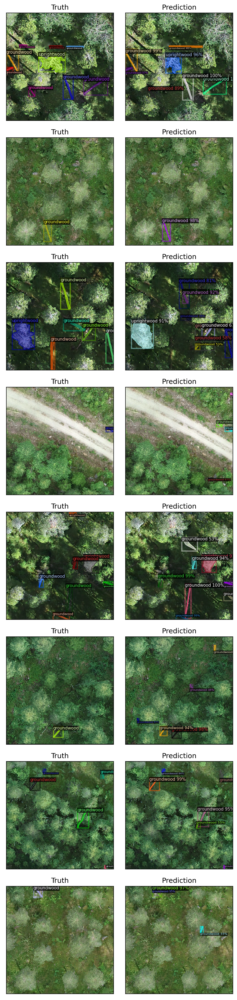

In [ ]:
dataset_dicts = DatasetCatalog.get('hiidenportti_val')
fig, axs = plt.subplots(8,2, dpi=300, figsize=(6,24))
for d, i in zip(random.sample(dataset_dicts, 8), range(0,8)):
    axs[i,0].set_xticks([])
    axs[i,0].set_yticks([])
    axs[i,1].set_xticks([])
    axs[i,1].set_yticks([])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get('hiidenportti_val'), scale=0.5)
    truth = visualizer.draw_dataset_dict(d)
    axs[i,0].imshow(truth.get_image()[...,::-1][...,::-1])
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get('hiidenportti_val'), scale=0.5)
    preds = predictor(img[...,::-1])
    pred = visualizer.draw_instance_predictions(preds["instances"].to("cpu"))
    axs[i,1].imshow(pred.get_image()[...,::-1][...,::-1])
    axs[i,0].set_title('Truth')
    axs[i,1].set_title('Prediction')
plt.tight_layout()

# Test plots

In [ ]:
testpath = Path('../data/hiidenportti/processed_test/')

In [ ]:
register_coco_instances('hiidenportti_test', {}, testpath/'full_hiidenportti_coco.json', testpath)

In [ ]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("hiidenportti_test", output_dir=cfg.OUTPUT_DIR, max_dets_per_image=100, use_fast_impl=False)
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5
val_loader = build_detection_test_loader(cfg, "hiidenportti_test")
print(inference_on_dataset(trainer.model, val_loader, evaluator))
# another equivalent way to evaluate the model is to use `trainer.test`

[12/23 14:44:16 d2.data.datasets.coco]: Loaded 163 images in COCO format from ../data/hiidenportti/processed_test/full_hiidenportti_coco.json
[12/23 14:44:16 d2.data.build]: Distribution of instances among all 2 categories:
|  category   | #instances   |  category  | #instances   |
|:-----------:|:-------------|:----------:|:-------------|
| uprightwood | 296          | groundwood | 1226         |
|             |              |            |              |
|    total    | 1522         |            |              |
[12/23 14:44:16 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/23 14:44:16 d2.data.common]: Serializing 163 elements to byte tensors and concatenating them all ...
[12/23 14:44:16 d2.data.common]: Serialized dataset takes 2.20 MiB
[12/23 14:44:16 d2.evaluation.evaluator]: Start inference on 163 batches
[12/23 14:44:17 d2.evaluation.evaluator]: Inference done 

In [ ]:
preds

{'instances': Instances(num_instances=30, image_height=512, image_width=512, fields=[pred_boxes: Boxes(tensor([[4.5452e+02, 0.0000e+00, 4.6964e+02, 2.2361e+01],
         [4.7164e+02, 1.3144e+01, 4.9645e+02, 9.6894e+01],
         [0.0000e+00, 4.3136e+02, 2.4387e+01, 4.4831e+02],
         [1.6263e+02, 4.4309e+02, 1.6966e+02, 4.8896e+02],
         [1.0601e+02, 7.3505e+01, 1.1352e+02, 1.3397e+02],
         [5.5257e+01, 3.9288e+02, 6.7332e+01, 4.1150e+02],
         [8.7839e-02, 2.3340e+02, 9.6941e+00, 2.4950e+02],
         [2.4805e+02, 9.5895e+01, 2.6491e+02, 1.0955e+02],
         [1.1507e+02, 4.8075e+02, 1.5600e+02, 5.1061e+02],
         [2.4941e+02, 9.7560e+01, 3.0529e+02, 1.3363e+02],
         [4.9625e+02, 1.0629e+02, 5.1159e+02, 1.1100e+02],
         [0.0000e+00, 4.1533e+02, 1.3681e+01, 4.2838e+02],
         [2.8553e+02, 1.1920e+02, 3.0603e+02, 1.3308e+02],
         [3.2480e-01, 4.3172e+02, 1.6282e+01, 4.4323e+02],
         [0.0000e+00, 4.1838e+02, 8.1151e+00, 4.2898e+02],
         [2.6

[12/23 14:51:11 d2.data.datasets.coco]: Loaded 163 images in COCO format from ../data/hiidenportti/processed_test/full_hiidenportti_coco.json


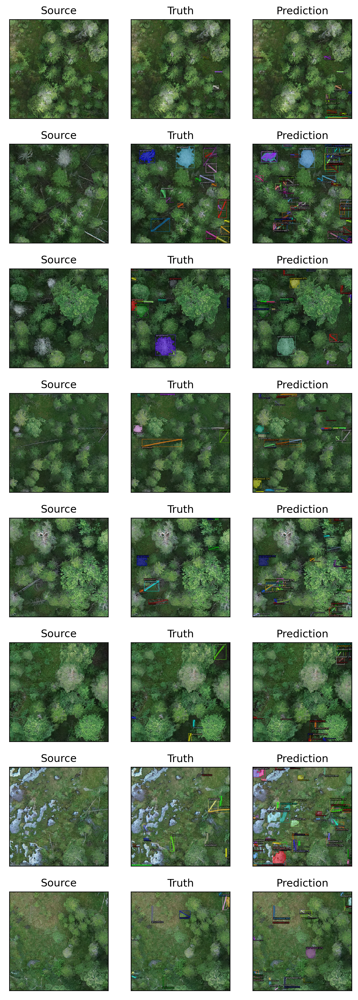

In [ ]:
dataset_dicts = DatasetCatalog.get('hiidenportti_test')
fig, axs = plt.subplots(8,3, dpi=300, figsize=(6,16))
ims = random.sample(dataset_dicts, 8)

for d, i in zip(ims, range(0,8)):
    axs[i,0].set_xticks([])
    axs[i,0].set_yticks([])
    axs[i,1].set_xticks([])
    axs[i,1].set_yticks([])
    axs[i,2].set_xticks([])
    axs[i,2].set_yticks([])
    img = cv2.imread(d["file_name"])
    axs[i,0].imshow(np.dstack((img[...,2],img[...,1], img[...,0])))
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get('hiidenportti_test'), scale=1)
    truth = visualizer.draw_dataset_dict(d)
    axs[i,1].imshow(truth.get_image()[...,::-1][...,::-1])
    visualizer = Visualizer(img[:, :, ::-1], metadata=MetadataCatalog.get('hiidenportti_test'), scale=1)
    preds = predictor(img[...,::-1])
    pred = visualizer.draw_instance_predictions(preds["instances"].to("cpu"))
    axs[i,2].imshow(pred.get_image()[...,::-1][...,::-1])
    axs[i,0].set_title('Source')
    axs[i,1].set_title('Truth')
    axs[i,2].set_title('Prediction')
plt.tight_layout()

In [ ]:
from drone_detector.coco import *

In [ ]:
images = [{'file_name': f['file_name'],
           'height': f['height'],
           'width': f['width'],
           'id': f['image_id']}
          for f in dataset_dicts]

In [ ]:
images[-1]

{'file_name': '../data/hiidenportti/processed/104_48_Hiidenportti_Chunk3_orto/raster_tiles/R3C1.tif',
 'height': 512,
 'width': 512,
 'id': 893}

In [ ]:
with open('detectron2_models/resnet_R_50_baseline_aug/coco_instances_results.json') as f:
    preds = json.load(f)


In [ ]:
preds = []
for i in tqdm(images):
    img = cv2.imread(i['file_name'])
    pred = (predictor(img[...,::-1]))
    preds.append(pred)


  0%|          | 0/753 [00:00<?, ?it/s]

In [ ]:
outdict = detectron2_mask_preds_to_coco_anns(images, preds)

/scratch/mayrajan/drone_detector/drone_detector/coco.py:44: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  contours = np.subtract(contours, 1)


In [ ]:
outdict['categories'] = [
        {'supercategory':'deadwood', 'id':1, 'name': 'uprightwood'},
        {'supercategory':'deadwood', 'id':2, 'name': 'groundwood'},
    ]

In [ ]:
coco_proc = COCOProcessor(data_path='detectron2_models/resnet_R_50_baseline_aug/',
                          outpath='detectron2_models/resnet_R_50_baseline_aug/',
                          coco_info = None, coco_licenses=None,
                          coco_categories = [
                                    {'supercategory':'deadwood', 'id':1, 'name': 'uprightwood'},
                                    {'supercategory':'deadwood', 'id':2, 'name': 'groundwood'},
                                ])

In [ ]:
coco_proc.coco_to_shp(outdict)

  0%|          | 0/753 [00:00<?, ?it/s]

RasterioIOError: detectron2_models/resnet_R_50_baseline_aug//raster_tiles/../data/hiidenportti/processed/104_92_Hiidenportti_Chunk6_orto/raster_tiles/R3C0.tif: No such file or directory